# 🔬 Master Thermal Edge Map Extraction & Study
### FLIR ADAS Dataset — Evaluation of Standard & Advanced Edge Detection Techniques

---

## 🧭 Project Overview

Thermal (infrared) cameras are essential for autonomous driving, robotics, surveillance, and industrial monitoring. However, raw thermal images present unique challenges that render standard visible-light computer vision pre-processing pipelines ineffective:
- **Low Contrast:** Thermal gradients can be very subtle compared to visible light, making edge extraction difficult.
- **Thermal Blur:** Optical characteristics of Germanium lenses and heat diffusion in scenes lead to soft, blurry edges.
- **Fixed Pattern Noise (FPN):** Sensor calibration errors cause striping, grain, and high-frequency noise that confuse derivative filters.

Extracting crisp, clean edge maps from thermal images is critical for downstream tasks like object detection (e.g., YOLO), semantic segmentation, and obstacle tracking in the dark or poor weather.

**Goal**: Systematically implement, benchmark, and compare **17 different edge detection techniques** (11 standard operators and 6 advanced/hybrid pipelines) on the FLIR ADAS Dataset, analyzing their performance on both blurry and sharp thermal frames.

### Research Phases

| Phase | Scope | Techniques Tested | Reference Images |
|---|---|---|---|
| **Phase 1** | Standard operators & baseline enhancements | Sobel, Scharr, Prewitt, Roberts, LoG, Fixed Canny, Adaptive Canny, DoG, CLAHE+Sobel, Phase Congruency, Multi-scale Canny | 2 (Blurriest vs. Sharpest) |
| **Phase 2** | Advanced, edge-preserving & hybrid filters | Perona-Malik + Sobel, Bilateral + Canny, Otsu-threshold Canny, Morphological Gradient, Guided Filter details, CLAHE + Perona + Sobel | 2 (Blurriest vs. Sharpest) |
| **Phase 3** | Quantitative benchmarking | Pixel-level edge density & strength metrics, runtime benchmarks | All 17 pipelines compared |


## 📐 Metrics Explained

We evaluate each edge detection technique using quantitative metrics:

| Metric | What it Measures | Formula / Description | Target Behavior |
|---|---|---|---|
| **Edge Density (%)** | Percentage of pixels detected as edges | `mean(EdgeMap > 30) * 100` | Moderate (Too high indicates noise; too low indicates missing edges) |
| **Mean Edge Strength** | Intensity of the gradient signal | `mean(EdgeMap)` (0–255 scale) | Higher is better (indicates stronger contrast at boundaries) |
| **Edge-to-Noise Ratio (ENR)** | Signal strength at edges relative to background noise floor | `mean(edges > 30) / (mean(background <= 30) + 1e-6)` | Higher is better (clean discrimination of true edges from noise) |
| **Components** | Total number of 8-connected edge segments | `cv2.connectedComponentsWithStats(binary, 8)` | Lower/Moderate is better (fewer fragmented noise specks) |
| **Continuity (px/comp)** | Average pixel length of continuous edge segments | `Edge Pixels / Components` | Higher is better (longer, continuous object boundaries) |
| **Noise Response (%)** | Percentage of edge pixels in flat background probe area | `100 * count_nonzero(probe) / probe.size` | Lower is better (0% ideal in flat regions) |
| **Tenengrad** | True edge sharpness and energy | `mean(Gx^2 + Gy^2)` | Higher is better (standard sharpness metric) |
| **Runtime (ms)** | Speed of processing | Time in milliseconds per frame | Lower is better (real-time friendly) |

> **Key insight**: Laplacian Variance is extremely sensitive to sensor noise spikes and high-frequency noise. Therefore, we rely on **Tenengrad**, **Edge-to-Noise Ratio (ENR)**, **Continuity**, **Components**, and **Edge Density** for validating structural edges in thermal images.


## 1. Setup & Imports


In [2]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter, convolve
import warnings
import time
warnings.filterwarnings('ignore')

%matplotlib inline
plt.style.use('dark_background')
print("Libraries loaded successfully ✓")


Libraries loaded successfully ✓


## 2. Load Dataset & Reference Frames

We load the FLIR ADAS reduced validation dataset and standardize on two representative frames:
1. **Blurriest Frame:** `FLIR_09047.jpeg` (Low contrast, poor details)
2. **Sharpest Frame:** `FLIR_09057.jpeg` (High contrast, crisp features)


Blurry Frame (FLIR_09047.jpeg): Laplacian Var = 54.04, Tenengrad = 1174.05
Sharp Frame (FLIR_09057.jpeg): Laplacian Var = 1113.13, Tenengrad = 9138.74


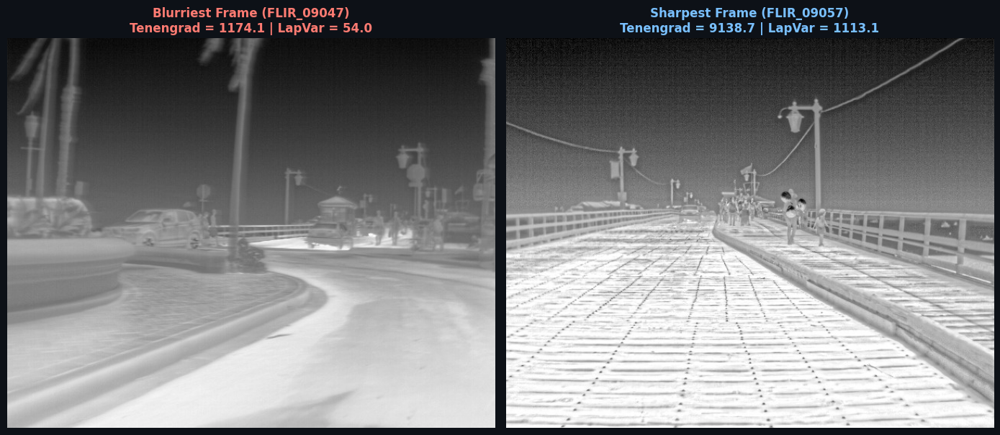

In [3]:
IMAGE_DIR = r"d:\jupyter\image_data\FLIR_ADAS_1_3_REDUCED\val\thermal_8_bit"
OUTPUT_DIR = r"d:\jupyter\results\edge_maps_study"
os.makedirs(OUTPUT_DIR, exist_ok=True)

BLURRIEST_FILE = "FLIR_09047.jpeg"
SHARPEST_FILE  = "FLIR_09057.jpeg"

blur_gray  = cv2.imread(os.path.join(IMAGE_DIR, BLURRIEST_FILE), cv2.IMREAD_GRAYSCALE)
sharp_gray = cv2.imread(os.path.join(IMAGE_DIR, SHARPEST_FILE), cv2.IMREAD_GRAYSCALE)

# Verify image loading
if blur_gray is None or sharp_gray is None:
    raise ValueError("Failed to load reference thermal images. Please check the dataset paths.")

def tenengrad(gray):
    gx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    gy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    return float(np.mean(gx**2 + gy**2))

def laplacian_variance(gray):
    return cv2.Laplacian(gray, cv2.CV_64F).var()

def edge_noise_ratio(edge_map, threshold=30):
    edges = edge_map[edge_map > threshold]
    background = edge_map[edge_map <= threshold]
    edge_strength = np.mean(edges) if edges.size > 0 else 0.0
    noise_strength = np.mean(background) + 1e-6
    enr = edge_strength / noise_strength
    return float(min(enr, 255.0))

blur_lv, blur_tg = laplacian_variance(blur_gray), tenengrad(blur_gray)
sharp_lv, sharp_tg = laplacian_variance(sharp_gray), tenengrad(sharp_gray)

print(f"Blurry Frame ({BLURRIEST_FILE}): Laplacian Var = {blur_lv:.2f}, Tenengrad = {blur_tg:.2f}")
print(f"Sharp Frame ({SHARPEST_FILE}): Laplacian Var = {sharp_lv:.2f}, Tenengrad = {sharp_tg:.2f}")

# Visualize reference frames
fig, axes = plt.subplots(1, 2, figsize=(14, 7))
fig.patch.set_facecolor('#0d1117')
axes[0].imshow(blur_gray, cmap='gray')
axes[0].set_title(f"Blurriest Frame (FLIR_09047)\nTenengrad = {blur_tg:.1f} | LapVar = {blur_lv:.1f}", color="#ff7b72", fontsize=12, fontweight="bold")
axes[0].axis('off')
axes[1].imshow(sharp_gray, cmap='gray')
axes[1].set_title(f"Sharpest Frame (FLIR_09057)\nTenengrad = {sharp_tg:.1f} | LapVar = {sharp_lv:.1f}", color="#79c0ff", fontsize=12, fontweight="bold")
axes[1].axis('off')
plt.tight_layout()
plt.show()


## 3. Standard Edge Detection Techniques (Phase 1)

Here, we implement 11 standard edge detection techniques. These range from simple first-order derivatives (Sobel, Prewitt, Scharr, Roberts) to second-order zero-crossing operators (Laplacian of Gaussian, Difference of Gaussians), classic Canny variations, and multi-scale/contrast-enhanced approaches.


In [4]:
def _norm(arr):
    mn, mx = arr.min(), arr.max()
    if mx - mn < 1e-8:
        return np.zeros_like(arr, dtype=np.uint8)
    return ((arr - mn) / (mx - mn) * 255).astype(np.uint8)

def _log_kernel(sigma, size=0):
    if size == 0:
        size = int(np.ceil(6 * sigma)) | 1
    ax = np.linspace(-(size // 2), size // 2, size)
    xx, yy = np.meshgrid(ax, ax)
    r2 = xx**2 + yy**2
    s2 = sigma**2
    k = (r2 - 2 * s2) / (s2**2) * np.exp(-r2 / (2 * s2))
    return k - k.mean()

def _zero_crossings(img):
    zc = np.zeros(img.shape, dtype=bool)
    zc[:-1, :] |= (img[:-1, :] * img[1:, :]) < 0
    zc[:, :-1] |= (img[:, :-1] * img[:, 1:]) < 0
    return zc

# Edge Operators
def edge_sobel(gray):
    gx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    gy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    return _norm(np.sqrt(gx**2 + gy**2))

def edge_scharr(gray):
    gx = cv2.Scharr(gray, cv2.CV_64F, 1, 0)
    gy = cv2.Scharr(gray, cv2.CV_64F, 0, 1)
    return _norm(np.sqrt(gx**2 + gy**2))

def edge_prewitt(gray):
    kx = np.array([[-1,0,1],[-1,0,1],[-1,0,1]], dtype=np.float64)
    gx = convolve(gray.astype(np.float64), kx)
    gy = convolve(gray.astype(np.float64), kx.T)
    return _norm(np.sqrt(gx**2 + gy**2))

def edge_roberts(gray):
    kr1 = np.array([[1,0],[0,-1]], dtype=np.float64)
    kr2 = np.array([[0,1],[-1,0]], dtype=np.float64)
    g1  = convolve(gray.astype(np.float64), kr1)
    g2  = convolve(gray.astype(np.float64), kr2)
    return _norm(np.sqrt(g1**2 + g2**2))

def edge_log(gray, sigma=2.0):
    blurred = gaussian_filter(gray.astype(np.float64), sigma=sigma)
    log_img = convolve(blurred, _log_kernel(sigma))
    zc      = _zero_crossings(log_img)
    return (zc.astype(np.uint8) * 255)

def edge_canny_fixed(gray, low=30, high=90):
    blurred = cv2.GaussianBlur(gray, (5, 5), 1.0)
    return cv2.Canny(blurred, low, high)

def edge_canny_adaptive(gray, low_pct=10, high_pct=20):
    gx  = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    gy  = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    mag = np.sqrt(gx**2 + gy**2).ravel()
    low  = np.percentile(mag, low_pct)
    high = np.percentile(mag, high_pct)
    return cv2.Canny(gray, low, high)

def edge_dog(gray, sigma1=1.0, sigma2=3.0):
    b1 = gaussian_filter(gray.astype(np.float64), sigma=sigma1)
    b2 = gaussian_filter(gray.astype(np.float64), sigma=sigma2)
    return _norm(np.abs(b1 - b2))

def edge_clahe_gradient(gray):
    clahe    = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(gray)
    gx = cv2.Sobel(enhanced, cv2.CV_64F, 1, 0, ksize=3)
    gy = cv2.Sobel(enhanced, cv2.CV_64F, 0, 1, ksize=3)
    return _norm(np.sqrt(gx**2 + gy**2))

def edge_phase_congruency(gray):
    scales  = [(1, 2), (2, 4), (4, 8)]
    pc_sum  = np.zeros(gray.shape, dtype=np.float64)
    for s1, s2 in scales:
        pc_sum += np.abs(
            gaussian_filter(gray.astype(np.float64), s1) -
            gaussian_filter(gray.astype(np.float64), s2)
        )
    return _norm(pc_sum)

def edge_multiscale_canny(gray):
    result = np.zeros(gray.shape, dtype=np.uint8)
    for sigma in [1, 2, 4]:
        blurred = cv2.GaussianBlur(gray, (0, 0), sigma)
        result  = cv2.bitwise_or(result, cv2.Canny(blurred, 20, 60))
    return result

TECHNIQUES_PHASE1 = [
    ("Sobel Magnitude",             edge_sobel, "hot", "3x3 Gaussian-weighted gradient magnitude. Robust baseline.", "Works on both. Blurry has thicker edges."),
    ("Scharr",                      edge_scharr, "hot", "Optimized 3x3 kernel for better rotational symmetry than Sobel.", "Slightly sharper edges than Sobel."),
    ("Prewitt",                     edge_prewitt, "hot", "Box gradient (no Gaussian weighting). Noise-sensitive.", "More artifact-prone on blurry image."),
    ("Roberts Cross",               edge_roberts, "hot", "2x2 diagonal gradient. Finest kernel, fragile to noise.", "Fails badly on blurry image."),
    ("LoG (Laplacian of Gaussian)", lambda g: edge_log(g, sigma=2.0), "gray", "2nd derivative zero-crossings. Sigma=2.0.", "Produces closed object contours."),
    ("Canny — Fixed Thresholds",    lambda g: edge_canny_fixed(g, 30, 90), "gray", "Fixed thresholds (low=30, high=90) with pre-blur.", "Reliable on both blurry and sharp."),
    ("Canny — Adaptive Thresholds", lambda g: edge_canny_adaptive(g, 10, 20), "gray", "Thresholds based on 10th and 20th gradient percentiles.", "Fails on blurry image due to noise."),
    ("DoG (Difference of Gaussians)", lambda g: edge_dog(g, 1.0, 3.0), "hot", "Difference of two Gaussian scales. Tunable bandpass.", "Good soft-edge heatmap."),
    ("CLAHE + Sobel Gradient",      edge_clahe_gradient, "hot", "CLAHE contrast enhancement before Sobel gradient.", "Best standard method for dim/blurry frames."),
    ("Phase Congruency (approx.)",  edge_phase_congruency, "plasma", "Multi-scale DoG sum. Responds to phase consistency.", "Illumination invariant, showing flat details."),
    ("Multi-scale Canny",           edge_multiscale_canny, "gray", "Union of Canny at sigma=1,2,4 scales.", "Excellent combination of fine/coarse edges.")
]
print("Phase 1 Edge Operators defined ✓")


Phase 1 Edge Operators defined ✓


### 3a. Plotting Before & After Strips for All Standard Operators
We generate a massive 11-row by 4-column comparison layout to evaluate all standard techniques.
- **Column 1:** Blurry original
- **Column 2:** Blurry edge map
- **Column 3:** Sharp original
- **Column 4:** Sharp edge map


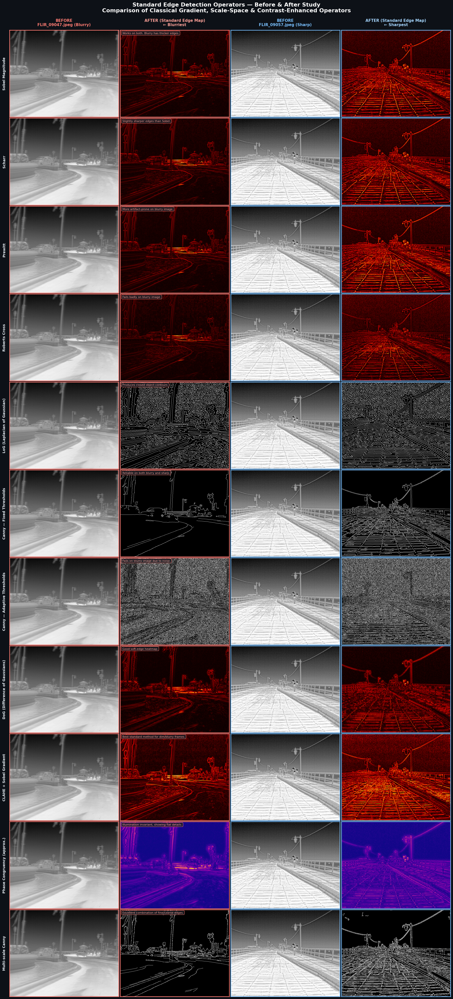

Comparison grid saved to: d:\jupyter\results\edge_maps_study\before_after_all_techniques.png


In [5]:
n = len(TECHNIQUES_PHASE1)
fig, axes = plt.subplots(n, 4, figsize=(18, n * 3.6))
fig.patch.set_facecolor("#0d1117")

COL_HEADERS = [
    f"BEFORE\n{BLURRIEST_FILE} (Blurry)",
    "AFTER (Standard Edge Map)\n← Blurriest",
    f"BEFORE\n{SHARPEST_FILE} (Sharp)",
    "AFTER (Standard Edge Map)\n← Sharpest"
]
HDR_COLORS = ["#ff7b72", "#ffa198", "#79c0ff", "#a5d6ff"]

for col_idx, (hdr, clr) in enumerate(zip(COL_HEADERS, HDR_COLORS)):
    axes[0, col_idx].set_title(hdr, color=clr, fontsize=11, fontweight="bold", pad=12)

for row_idx, (name, fn, cmap, desc, obs) in enumerate(TECHNIQUES_PHASE1):
    blur_edge = fn(blur_gray)
    sharp_edge = fn(sharp_gray)
    
    panels = [
        (blur_gray, "gray"),
        (blur_edge, cmap),
        (sharp_gray, "gray"),
        (sharp_edge, cmap)
    ]
    
    for col_idx, (img, cm) in enumerate(panels):
        ax = axes[row_idx, col_idx]
        ax.imshow(img, cmap=cm, aspect="auto")
        ax.set_xticks([])
        ax.set_yticks([])
        
        spine_color = "#ff7b72" if col_idx < 2 else "#79c0ff"
        for spine in ax.spines.values():
            spine.set_edgecolor(spine_color)
            spine.set_linewidth(1.8)
            
    axes[row_idx, 0].set_ylabel(name, color="#e6edf3", fontsize=10, fontweight="bold", rotation=90, labelpad=10)
    
    # Text annotation in second column (blurry edge map)
    axes[row_idx, 1].text(
        0.02, 0.98, obs,
        transform=axes[row_idx, 1].transAxes,
        color="#ffa198", fontsize=8, va="top", ha="left",
        bbox=dict(boxstyle="round,pad=0.3", fc="#161b22", ec="#ff7b72", alpha=0.85)
    )

fig.suptitle(
    "Standard Edge Detection Operators — Before & After Study\n"
    "Comparison of Classical Gradient, Scale-Space & Contrast-Enhanced Operators",
    fontsize=16, color="white", fontweight="bold", y=1.002
)
plt.tight_layout(pad=0.5, h_pad=0.3, w_pad=0.4)
out1 = os.path.join(OUTPUT_DIR, "before_after_all_techniques.png")
plt.savefig(out1, dpi=110, bbox_inches="tight", facecolor=fig.get_facecolor())
plt.show()
print(f"Comparison grid saved to: {out1}")


### 3b. Spotlight: Top 4 Standard Techniques
We highlight 4 key standard techniques with higher resolution subplots to examine their edge structures:
1. **Sobel Magnitude:** Baseline standard
2. **CLAHE + Sobel Gradient:** Best contrast-enhanced gradient
3. **LoG (sigma=2.0):** Closed boundary contour-style
4. **Multi-scale Canny:** Full details preservation across scales


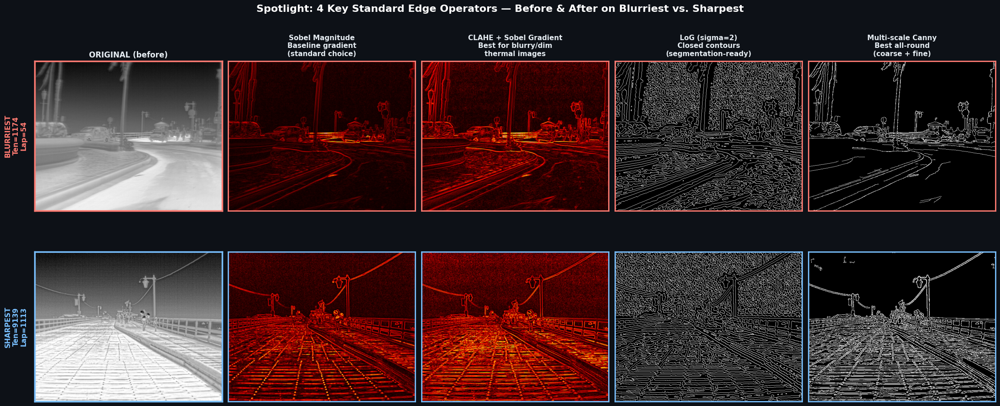

Spotlight plot saved to: d:\jupyter\results\edge_maps_study\spotlight_before_after.png


In [6]:
SPOTLIGHT = [
    ("Sobel Magnitude",        edge_sobel,           "hot",    "Baseline gradient\n(standard choice)"),
    ("CLAHE + Sobel Gradient", edge_clahe_gradient,  "hot",    "Best for blurry/dim\nthermal images"),
    ("LoG (sigma=2)",          lambda g: edge_log(g,2.0), "gray", "Closed contours\n(segmentation-ready)"),
    ("Multi-scale Canny",      edge_multiscale_canny,"gray",   "Best all-round\n(coarse + fine)"),
]

fig, axes = plt.subplots(2, 5, figsize=(22, 10))
fig.patch.set_facecolor("#0d1117")

ROW_INFO = [
    (blur_gray,  "#ff7b72", f"BLURRIEST\nTen={blur_tg:.0f}\nLap={blur_lv:.0f}"),
    (sharp_gray, "#79c0ff", f"SHARPEST\nTen={sharp_tg:.0f}\nLap={sharp_lv:.0f}"),
]

for row_idx, (gray, row_color, row_label) in enumerate(ROW_INFO):
    axes[row_idx, 0].imshow(gray, cmap="gray")
    axes[row_idx, 0].set_title("ORIGINAL (before)" if row_idx == 0 else "", color="#e6edf3", fontsize=12, fontweight="bold")
    axes[row_idx, 0].set_ylabel(row_label, color=row_color, fontsize=11, fontweight="bold", rotation=90, labelpad=12)
    axes[row_idx, 0].set_xticks([])
    axes[row_idx, 0].set_yticks([])
    for spine in axes[row_idx, 0].spines.values():
        spine.set_edgecolor(row_color)
        spine.set_linewidth(2.5)

    for col_idx, (tech_name, fn, cmap, short_desc) in enumerate(SPOTLIGHT):
        ax = axes[row_idx, col_idx + 1]
        edge = fn(gray)
        ax.imshow(edge, cmap=cmap)
        if row_idx == 0:
            ax.set_title(f"{tech_name}\n{short_desc}", color="#e6edf3", fontsize=11, fontweight="bold", pad=8)
        ax.set_xticks([])
        ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_edgecolor(row_color)
            spine.set_linewidth(2.0)

fig.suptitle(
    "Spotlight: 4 Key Standard Edge Operators — Before & After on Blurriest vs. Sharpest",
    fontsize=16, color="white", fontweight="bold", y=0.98
)
plt.tight_layout(pad=1.0)
out2 = os.path.join(OUTPUT_DIR, "spotlight_before_after.png")
plt.savefig(out2, dpi=130, bbox_inches="tight", facecolor=fig.get_facecolor())
plt.show()
print(f"Spotlight plot saved to: {out2}")


## 4. Why Adaptive Canny Fails on Blurry Thermal Images (Case Study)

Many default computer vision pipelines employ **Adaptive Canny Edge Detection** where hysteresis thresholds are set dynamically based on percentiles of the image's gradient magnitude. While this works well for high-contrast visible light cameras, it is highly problematic for thermal images, particularly blurry or dim ones.

### The Physics of the Failure:
1. **Low Signal-to-Noise Ratio (SNR):** Blurry thermal images have very low gradient magnitudes. The difference between real structural edges and flat noise regions is minimal.
2. **Threshold Collapse:** When Canny computes thresholds based on percentiles (e.g., the 10th and 20th percentiles of the gradient magnitude), and the overall gradient energy in the image is tiny, the thresholds collapse into the noise floor.
3. **Noise Amplification:** Consequently, Canny treats sensor noise spikes as valid edges, resulting in a chaotic "salt-and-pepper" noise map instead of clean contours.
4. **The Remedy:** Using **fixed thresholds** (e.g., `low=30, high=90`) prevents the thresholds from falling below the sensor's physical noise floor. Alternatively, applying **CLAHE** first amplifies the latent thermal gradients before edge extraction.


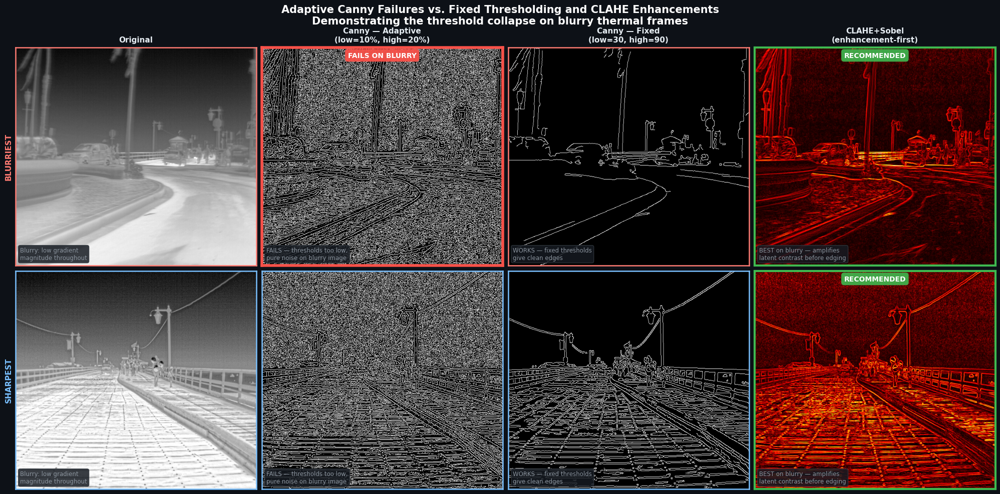

Failure analysis saved to: d:\jupyter\results\edge_maps_study\canny_failure_analysis.png


In [7]:
canny_variants = [
    ("Original",                               lambda g: g,                          "gray", "Blurry: low gradient\nmagnitude throughout"),
    ("Canny — Adaptive\n(low=10%, high=20%)", lambda g: edge_canny_adaptive(g),      "gray", "FAILS — thresholds too low,\npure noise on blurry image"),
    ("Canny — Fixed\n(low=30, high=90)",       lambda g: edge_canny_fixed(g, 30, 90), "gray", "WORKS — fixed thresholds\ngive clean edges"),
    ("CLAHE+Sobel\n(enhancement-first)",       edge_clahe_gradient,                  "hot",  "BEST on blurry — amplifies\nlatent contrast before edging"),
]

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
fig.patch.set_facecolor("#0d1117")

for row_idx, (gray, row_color, row_lbl) in enumerate([
        (blur_gray,  "#ff7b72", "BLURRIEST"),
        (sharp_gray, "#79c0ff", "SHARPEST")]):
    for col_idx, (lbl, fn, cmap, note) in enumerate(canny_variants):
        ax = axes[row_idx, col_idx]
        img = fn(gray)
        ax.imshow(img, cmap=cmap, aspect="auto")

        if row_idx == 0:
            ax.set_title(lbl, color="#e6edf3", fontsize=11, fontweight="bold", pad=8)

        # Highlight the failure case
        if col_idx == 1 and row_idx == 0:
            for spine in ax.spines.values():
                spine.set_edgecolor("#f85149")
                spine.set_linewidth(4)
            ax.text(0.5, 0.98, "FAILS ON BLURRY", transform=ax.transAxes,
                    ha="center", va="top", color="white", fontsize=10,
                    fontweight="bold",
                    bbox=dict(boxstyle="round,pad=0.4", fc="#f85149", ec="none", alpha=0.95))
        elif col_idx == 3:
            for spine in ax.spines.values():
                spine.set_edgecolor("#3fb950")
                spine.set_linewidth(3)
            ax.text(0.5, 0.98, "RECOMMENDED", transform=ax.transAxes,
                    ha="center", va="top", color="white", fontsize=10,
                    fontweight="bold",
                    bbox=dict(boxstyle="round,pad=0.4", fc="#3fb950", ec="none", alpha=0.90))
        else:
            for spine in ax.spines.values():
                spine.set_edgecolor(row_color)
                spine.set_linewidth(1.8)

        ax.set_ylabel(row_lbl if col_idx == 0 else "", color=row_color, fontsize=11, fontweight="bold")
        ax.text(0.02, 0.02, note, transform=ax.transAxes,
                color="#8b949e", fontsize=8.5, va="bottom", ha="left",
                bbox=dict(boxstyle="round,pad=0.3", fc="#161b22", ec="#30363d", alpha=0.85))
        ax.set_xticks([])
        ax.set_yticks([])

fig.suptitle(
    "Adaptive Canny Failures vs. Fixed Thresholding and CLAHE Enhancements\n"
    "Demonstrating the threshold collapse on blurry thermal frames",
    fontsize=15, color="white", fontweight="bold", y=0.98
)
plt.tight_layout(pad=0.8)
out3 = os.path.join(OUTPUT_DIR, "canny_failure_analysis.png")
plt.savefig(out3, dpi=120, bbox_inches="tight", facecolor=fig.get_facecolor())
plt.show()
print(f"Failure analysis saved to: {out3}")


## 5. Advanced Edge Detection Techniques (Phase 2)

Standard operators (Phase 1) suffer from noise sensitivity or halo artifacts because they apply linear filters.

**Phase 2** explores non-linear, edge-preserving diffusion and detail decomposition techniques:
1. **Perona-Malik Anisotropic Diffusion:** Iterative smoothing that occurs preferentially in flat areas rather than across strong edges (controlled by image gradients).
2. **Bilateral Filter:** Edge-preserving smoothing filter incorporating spatial distance and pixel value difference.
3. **Guided Filter:** A fast linear-time edge-preserving filter that uses a guidance image (in our case, the image itself) to compute local weights, avoiding halo effects.
4. **Morphological Gradient:** Edge extraction computed as `Dilation - Erosion`, showing exceptional stability against small noise spikes.


In [8]:
def perona_malik(img, num_iter=15, delta_t=0.14, kappa=15, option=1):
    I = img.astype(np.float64)
    for _ in range(num_iter):
        padded = np.pad(I, 1, mode='edge')
        N = padded[:-2, 1:-1] - I
        S = padded[2:, 1:-1] - I
        E = padded[1:-1, 2:] - I
        W = padded[1:-1, :-2] - I

        if option == 1:
            cN = np.exp(-(N / kappa) ** 2)
            cS = np.exp(-(S / kappa) ** 2)
            cE = np.exp(-(E / kappa) ** 2)
            cW = np.exp(-(W / kappa) ** 2)
        else:
            cN = 1.0 / (1.0 + (N / kappa) ** 2)
            cS = 1.0 / (1.0 + (S / kappa) ** 2)
            cE = 1.0 / (1.0 + (E / kappa) ** 2)
            cW = 1.0 / (1.0 + (W / kappa) ** 2)

        I = I + delta_t * (cN * N + cS * S + cE * E + cW * W)
    return np.clip(I, 0, 255).astype(np.uint8)

def guided_filter(I, p, r, eps):
    mean_I = cv2.boxFilter(I, cv2.CV_64F, (r, r))
    mean_p = cv2.boxFilter(p, cv2.CV_64F, (r, r))
    mean_Ip = cv2.boxFilter(I * p, cv2.CV_64F, (r, r))
    cov_Ip = mean_Ip - mean_I * mean_p

    mean_II = cv2.boxFilter(I * I, cv2.CV_64F, (r, r))
    var_I = mean_II - mean_I * mean_I

    a = cov_Ip / (var_I + eps)
    b = mean_p - a * mean_I

    mean_a = cv2.boxFilter(a, cv2.CV_64F, (r, r))
    mean_b = cv2.boxFilter(b, cv2.CV_64F, (r, r))

    q = mean_a * I + mean_b
    return q

# Advanced Pipelines
def tech_perona_malik_sobel(gray):
    smoothed = perona_malik(gray, num_iter=15, delta_t=0.14, kappa=15)
    gx = cv2.Sobel(smoothed, cv2.CV_64F, 1, 0, ksize=3)
    gy = cv2.Sobel(smoothed, cv2.CV_64F, 0, 1, ksize=3)
    return _norm(np.sqrt(gx**2 + gy**2))

def tech_bilateral_canny(gray):
    smoothed = cv2.bilateralFilter(gray, d=9, sigmaColor=50, sigmaSpace=50)
    return cv2.Canny(smoothed, 30, 90)

def tech_otsu_canny(gray):
    blurred = cv2.GaussianBlur(gray, (5, 5), 1.0)
    high_thresh, _ = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    low_thresh = 0.5 * high_thresh
    return cv2.Canny(blurred, low_thresh, high_thresh)

def tech_morphological_gradient(gray):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    return cv2.morphologyEx(gray, cv2.MORPH_GRADIENT, kernel)

def tech_guided_filter_edge(gray):
    I = gray.astype(np.float64) / 255.0
    base = guided_filter(I, I, r=8, eps=0.01)
    detail = I - base
    detail_uint8 = _norm(detail)
    gx = cv2.Sobel(detail_uint8, cv2.CV_64F, 1, 0, ksize=3)
    gy = cv2.Sobel(detail_uint8, cv2.CV_64F, 0, 1, ksize=3)
    return _norm(np.sqrt(gx**2 + gy**2))

def tech_clahe_perona_sobel(gray):
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(gray)
    smoothed = perona_malik(enhanced, num_iter=15, delta_t=0.14, kappa=15)
    gx = cv2.Sobel(smoothed, cv2.CV_64F, 1, 0, ksize=3)
    gy = cv2.Sobel(smoothed, cv2.CV_64F, 0, 1, ksize=3)
    return _norm(np.sqrt(gx**2 + gy**2))

TECHNIQUES_PHASE2 = [
    ("Perona-Malik + Sobel",       tech_perona_malik_sobel,    "hot",  "Anisotropic diffusion preserves edges while smoothing noise before Sobel."),
    ("Bilateral + Canny",         tech_bilateral_canny,       "gray", "Bilateral filter retains sharp boundaries and eliminates texture before Canny."),
    ("Otsu Canny",                 tech_otsu_canny,            "gray", "Automatically derives Canny thresholds based on Otsu binarization."),
    ("Morphological Gradient",     tech_morphological_gradient,"hot",  "Computes (Dilation - Erosion). Highly stable against minor noise/gradients."),
    ("Guided Filter Edges",        tech_guided_filter_edge,    "hot",  "Extracts detail layer via Guided Filter and runs Sobel on high frequencies."),
    ("CLAHE + Perona + Sobel",     tech_clahe_perona_sobel,    "hot",  "Combines CLAHE contrast, Anisotropic Diffusion smoothing, and Sobel gradient.")
]
print("Phase 2 Advanced Techniques defined ✓")


Phase 2 Advanced Techniques defined ✓


### 5a. Before & After Strips for Advanced Techniques
We construct a 6-row by 4-column layout demonstrating the results of the advanced edge map pipelines, showing original and edge maps for both blurry and sharp images.


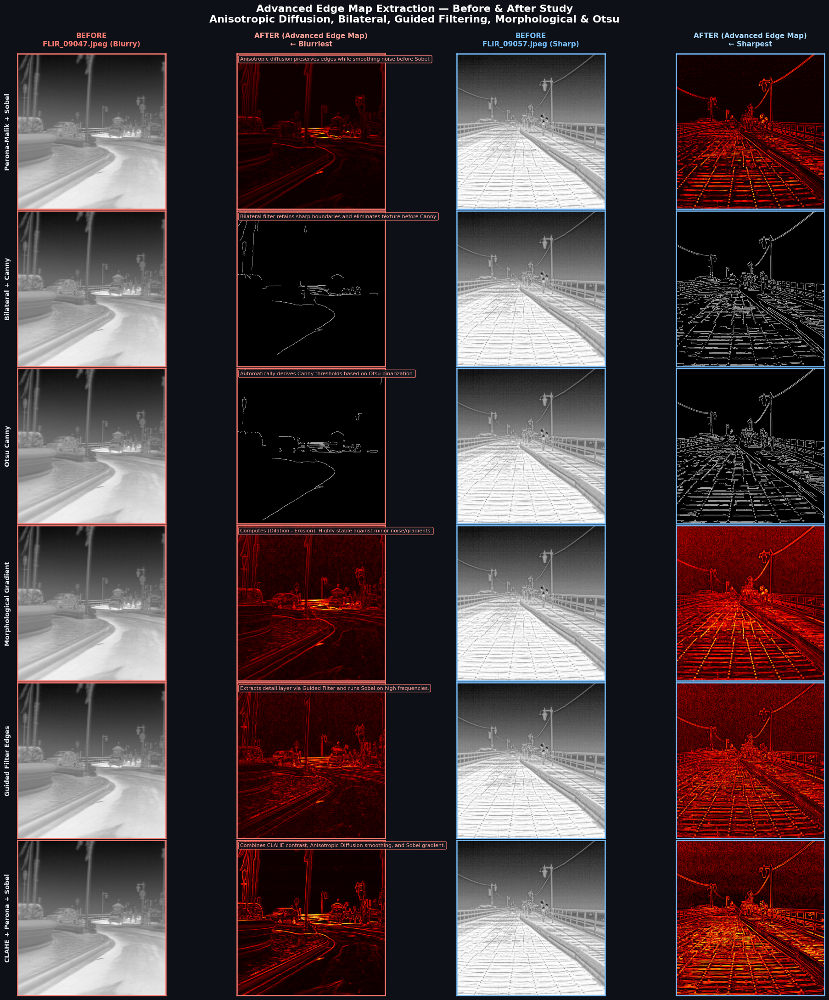

Advanced comparison saved to: d:\jupyter\results\edge_maps_advanced\advanced_before_after_comparison.png


In [9]:
n = len(TECHNIQUES_PHASE2)
fig, axes = plt.subplots(n, 4, figsize=(18, n * 3.6))
fig.patch.set_facecolor("#0d1117")

COL_HEADERS = [
    f"BEFORE\n{BLURRIEST_FILE} (Blurry)",
    "AFTER (Advanced Edge Map)\n← Blurriest",
    f"BEFORE\n{SHARPEST_FILE} (Sharp)",
    "AFTER (Advanced Edge Map)\n← Sharpest"
]
HDR_COLORS = ["#ff7b72", "#ffa198", "#79c0ff", "#a5d6ff"]

for col_idx, (hdr, clr) in enumerate(zip(COL_HEADERS, HDR_COLORS)):
    axes[0, col_idx].set_title(hdr, color=clr, fontsize=11, fontweight="bold", pad=12)

ADV_OUTPUT_DIR = r"d:\jupyter\results\edge_maps_advanced"
os.makedirs(ADV_OUTPUT_DIR, exist_ok=True)

for row_idx, (name, fn, cmap, desc) in enumerate(TECHNIQUES_PHASE2):
    blur_edge = fn(blur_gray)
    sharp_edge = fn(sharp_gray)
    
    panels = [
        (blur_gray, "gray"),
        (blur_edge, cmap),
        (sharp_gray, "gray"),
        (sharp_edge, cmap)
    ]
    
    for col_idx, (img, cm) in enumerate(panels):
        ax = axes[row_idx, col_idx]
        ax.imshow(img, cmap=cm, aspect="auto")
        ax.set_xticks([])
        ax.set_yticks([])
        
        spine_color = "#ff7b72" if col_idx < 2 else "#79c0ff"
        for spine in ax.spines.values():
            spine.set_edgecolor(spine_color)
            spine.set_linewidth(1.8)
            
    axes[row_idx, 0].set_ylabel(name, color="#e6edf3", fontsize=10, fontweight="bold", rotation=90, labelpad=10)
    
    # Text annotation
    axes[row_idx, 1].text(
        0.02, 0.98, desc,
        transform=axes[row_idx, 1].transAxes,
        color="#ffa198", fontsize=8, va="top", ha="left",
        bbox=dict(boxstyle="round,pad=0.3", fc="#161b22", ec="#ff7b72", alpha=0.85)
    )

fig.suptitle(
    "Advanced Edge Map Extraction — Before & After Study\n"
    "Anisotropic Diffusion, Bilateral, Guided Filtering, Morphological & Otsu",
    fontsize=16, color="white", fontweight="bold", y=1.002
)
plt.tight_layout(pad=0.5, h_pad=0.3, w_pad=0.4)
out_path = os.path.join(ADV_OUTPUT_DIR, "advanced_before_after_comparison.png")
plt.savefig(out_path, dpi=120, bbox_inches="tight", facecolor=fig.get_facecolor())
plt.show()
print(f"Advanced comparison saved to: {out_path}")


## 6. Quantitative Comparison & Performance Study

To systematically determine the best performing algorithms, we compute comprehensive metrics across all 17 techniques:
1. **Edge Density (%):** Percentage of pixels in the edge map with intensity > 30.
2. **Components:** Total number of 8-connected edge components (`cv2.connectedComponentsWithStats`).
3. **Continuity (px/comp):** Average pixel length per connected component (higher means longer, continuous edges).
4. **Edge-to-Noise Ratio (ENR):** Ratio of mean edge strength (>30) to background noise floor (<=30).
5. **Noise Response (%):** Percentage of edge pixels inside a flat background probe patch.
6. **Mean Edge Strength:** Average intensity of detected edge pixels (0-255).
7. **Runtime (ms):** Average time taken to execute edge detection on a single frame.


In [10]:
ALL_TECHNIQUES = [
    # Phase 1: Standard
    ("Sobel Magnitude",             edge_sobel, "Standard", "ksize=3"),
    ("Scharr",                      edge_scharr, "Standard", "3x3"),
    ("Prewitt",                     edge_prewitt, "Standard", "3x3"),
    ("Roberts Cross",               edge_roberts, "Standard", "2x2"),
    ("LoG (Laplacian of Gaussian)", lambda g: edge_log(g, sigma=2.0), "Standard", "sigma=2.0"),
    ("Canny — Fixed Thresholds",    lambda g: edge_canny_fixed(g, 30, 90), "Standard", "30/90"),
    ("Canny — Adaptive Thresholds", lambda g: edge_canny_adaptive(g, 10, 20), "Standard", "auto (10%/20%)"),
    ("DoG (Difference of Gaussians)", lambda g: edge_dog(g, 1.0, 3.0), "Standard", "sigma=1.0/3.0"),
    ("CLAHE + Sobel Gradient",      edge_clahe_gradient, "Standard", "clip=3.0, grid=8x8"),
    ("Phase Congruency (approx.)",  edge_phase_congruency, "Standard", "multi-scale DoG"),
    ("Multi-scale Canny",           edge_multiscale_canny, "Standard", "sigma=1,2,4"),
    # Phase 2: Advanced
    ("Perona-Malik + Sobel",       tech_perona_malik_sobel, "Advanced", "iter=15, kappa=15"),
    ("Bilateral + Canny",         tech_bilateral_canny, "Advanced", "d=9, 30/90"),
    ("Otsu Canny",                 tech_otsu_canny, "Advanced", "Otsu threshold"),
    ("Morphological Gradient",     tech_morphological_gradient, "Advanced", "3x3 rect"),
    ("Guided Filter Edges",        tech_guided_filter_edge, "Advanced", "r=8, eps=0.01"),
    ("CLAHE + Perona + Sobel",     tech_clahe_perona_sobel, "Advanced", "clip=3.0, iter=15")
]

def compute_frame_metrics(em, threshold=30):
    b = (em > threshold).astype(np.uint8)
    n_edge = int(np.count_nonzero(b))
    dens = 100.0 * n_edge / b.size
    n_lab, _, _, _ = cv2.connectedComponentsWithStats(b, connectivity=8)
    n_comp = max(n_lab - 1, 0)
    cont = n_edge / n_comp if n_comp > 0 else 0.0
    enr = edge_noise_ratio(em, threshold=threshold)
    mean_str = float(np.mean(em))
    return dens, n_comp, cont, enr, mean_str

records = []
print("Evaluating all 17 techniques on reference frames...")

for name, fn, category, param in ALL_TECHNIQUES:
    t_start = time.perf_counter()
    for _ in range(5):
        _ = fn(blur_gray)
    t_end = time.perf_counter()
    runtime_ms = ((t_end - t_start) / 5.0) * 1000.0
    
    be = fn(blur_gray)
    se = fn(sharp_gray)
    
    b_dens, b_comp, b_cont, b_enr, b_mean = compute_frame_metrics(be)
    s_dens, s_comp, s_cont, s_enr, s_mean = compute_frame_metrics(se)
    
    records.append({
        "Method": name,
        "Parameter": param,
        "Category": category,
        "Blurry Density (%)": round(b_dens, 2),
        "Sharp Density (%)": round(s_dens, 2),
        "Blurry Components": b_comp,
        "Sharp Components": s_comp,
        "Blurry Continuity (px/comp)": round(b_cont, 2),
        "Sharp Continuity (px/comp)": round(s_cont, 2),
        "Blurry ENR": round(b_enr, 2),
        "Sharp ENR": round(s_enr, 2),
        "Runtime (ms)": round(runtime_ms, 2)
    })

df_results = pd.DataFrame(records)
df_results


Evaluating all 17 techniques on reference frames...


,Method,Parameter,Category,Blurry Density (%),Sharp Density (%),Blurry Components,Sharp Components,Blurry Continuity (px/comp),Sharp Continuity (px/comp),Blurry ENR,Sharp ENR,Runtime (ms)
0,Sobel Magnitude,ksize=3,Standard,7.56,30.63,717,3402,34.56,29.50,6.16,4.86,6.59
1,Scharr,3x3,Standard,7.61,30.22,744,4291,33.54,23.08,6.05,4.63,6.23
2,Prewitt,3x3,Standard,7.49,31.85,670,3813,36.64,27.37,6.22,4.94,9.12
3,Roberts Cross,2x2,Standard,4.07,25.35,975,6182,13.68,13.44,6.10,3.88,8.53
4,LoG (Laplacian of Gaussian),sigma=2.0,Standard,16.68,19.83,294,298,185.93,218.02,255.00,255.00,45.20
5,Canny — Fixed Thresholds,30/90,Standard,2.56,12.26,87,645,96.40,62.29,255.00,255.00,0.42
6,Canny — Adaptive Thresholds,auto (10%/20%),Standard,32.31,32.61,6689,6701,15.83,15.95,255.00,255.00,12.05
7,DoG (Difference of Gaussians),sigma=1.0/3.0,Standard,9.58,24.85,734,1465,42.75,55.59,7.23,5.42,14.73
8,CLAHE + Sobel Gradient,"clip=3.0, grid=8x8",Standard,21.05,50.52,2590,3350,26.64,49.41,4.35,4.25,6.16
9,Phase Congruency (approx.),multi-scale DoG,Standard,20.43,28.22,352,933,190.20,99.11,5.78,4.23,55.10


### 6a. Plotted Results: Edge Density & Mean Edge Strength
We visualize the performance parameters via side-by-side bar charts to compare edge coverage and sharpness strength between the blurry and sharp frames.


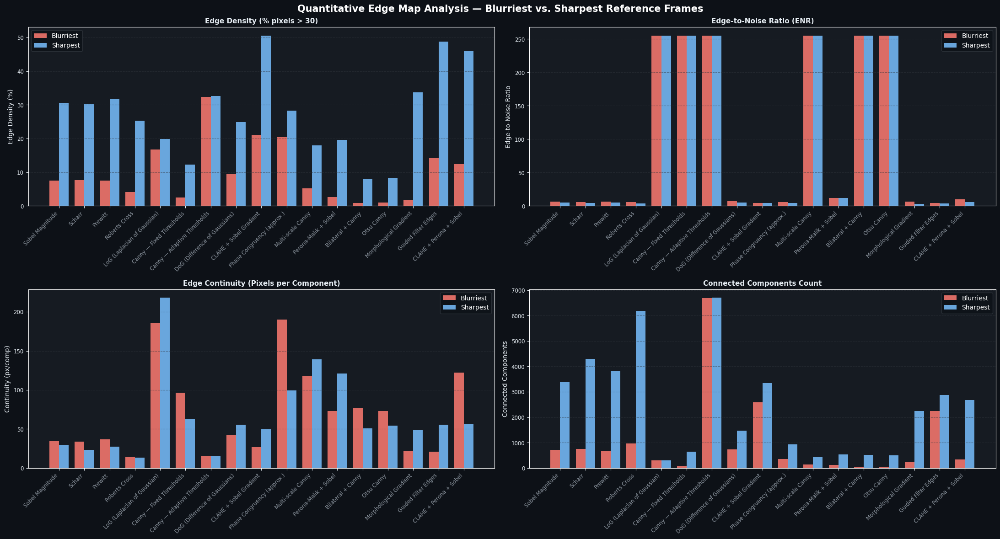

Quantitative charts saved to: d:\jupyter\results\edge_maps_study\quantitative_analysis.png


In [11]:
names = df_results["Method"].tolist()
b_dens = df_results["Blurry Density (%)"].tolist()
s_dens = df_results["Sharp Density (%)"].tolist()
b_enr  = df_results["Blurry ENR"].tolist()
s_enr  = df_results["Sharp ENR"].tolist()
b_cont = df_results["Blurry Continuity (px/comp)"].tolist()
s_cont = df_results["Sharp Continuity (px/comp)"].tolist()
b_comp = df_results["Blurry Components"].tolist()
s_comp = df_results["Sharp Components"].tolist()

x = np.arange(len(names))
w = 0.38

fig, axes = plt.subplots(2, 2, figsize=(22, 12))
fig.patch.set_facecolor("#0d1117")
ax_d, ax_e, ax_c, ax_p = axes.flatten()

for ax in (ax_d, ax_e, ax_c, ax_p):
    ax.set_facecolor("#161b22")
    ax.tick_params(colors="#e6edf3", labelsize=8.5)
    ax.grid(axis="y", color="#30363d", linestyle="--", alpha=0.5)

# 1. Edge Density
ax_d.bar(x - w/2, b_dens, width=w, label="Blurriest", color="#ff7b72", alpha=0.85)
ax_d.bar(x + w/2, s_dens, width=w, label="Sharpest",  color="#79c0ff", alpha=0.85)
ax_d.set_ylabel("Edge Density (%)", color="#e6edf3", fontsize=10)
ax_d.set_title("Edge Density (% pixels > 30)", color="#e6edf3", fontsize=11, fontweight="bold")
ax_d.set_xticks(x)
ax_d.set_xticklabels(names, rotation=45, ha="right", color="#8b949e")
ax_d.legend(facecolor="#0d1117", labelcolor="white", edgecolor="#30363d")

# 2. Edge-to-Noise Ratio (ENR)
ax_e.bar(x - w/2, b_enr, width=w, label="Blurriest", color="#ff7b72", alpha=0.85)
ax_e.bar(x + w/2, s_enr, width=w, label="Sharpest",  color="#79c0ff", alpha=0.85)
ax_e.set_ylabel("Edge-to-Noise Ratio", color="#e6edf3", fontsize=10)
ax_e.set_title("Edge-to-Noise Ratio (ENR)", color="#e6edf3", fontsize=11, fontweight="bold")
ax_e.set_xticks(x)
ax_e.set_xticklabels(names, rotation=45, ha="right", color="#8b949e")
ax_e.legend(facecolor="#0d1117", labelcolor="white", edgecolor="#30363d")

# 3. Continuity (px/comp)
ax_c.bar(x - w/2, b_cont, width=w, label="Blurriest", color="#ff7b72", alpha=0.85)
ax_c.bar(x + w/2, s_cont, width=w, label="Sharpest",  color="#79c0ff", alpha=0.85)
ax_c.set_ylabel("Continuity (px/comp)", color="#e6edf3", fontsize=10)
ax_c.set_title("Edge Continuity (Pixels per Component)", color="#e6edf3", fontsize=11, fontweight="bold")
ax_c.set_xticks(x)
ax_c.set_xticklabels(names, rotation=45, ha="right", color="#8b949e")
ax_c.legend(facecolor="#0d1117", labelcolor="white", edgecolor="#30363d")

# 4. Connected Components
ax_p.bar(x - w/2, b_comp, width=w, label="Blurriest", color="#ff7b72", alpha=0.85)
ax_p.bar(x + w/2, s_comp, width=w, label="Sharpest",  color="#79c0ff", alpha=0.85)
ax_p.set_ylabel("Connected Components", color="#e6edf3", fontsize=10)
ax_p.set_title("Connected Components Count", color="#e6edf3", fontsize=11, fontweight="bold")
ax_p.set_xticks(x)
ax_p.set_xticklabels(names, rotation=45, ha="right", color="#8b949e")
ax_p.legend(facecolor="#0d1117", labelcolor="white", edgecolor="#30363d")

fig.suptitle("Quantitative Edge Map Analysis — Blurriest vs. Sharpest Reference Frames", color="white", fontsize=15, fontweight="bold", y=0.98)
plt.tight_layout(pad=1.2)
out_chart = os.path.join(OUTPUT_DIR, "quantitative_analysis.png")
plt.savefig(out_chart, dpi=120, bbox_inches="tight", facecolor=fig.get_facecolor())
plt.show()
print(f"Quantitative charts saved to: {out_chart}")


### 6b. Dataset-Wide Quantitative Benchmarking (Live Execution at Runtime)

To ensure our conclusions are statistically robust and not limited to reference frames, we execute a **live benchmark at runtime** over a reproducible random sample of FLIR thermal images (`random.seed(42)`).

We dynamically compute **Edge Density (%)**, **Components**, **Continuity (px/comp)**, **Edge-to-Noise Ratio (ENR)**, **Noise Response (%)**, and **Runtime (ms)** across all 17 operators at this instant.


In [12]:
import random

# Section 6b: Live Dataset-Wide Quantitative Benchmark
# Runs dynamically at runtime on a sample of thermal images (No pre-computed CSV!)

img_files = sorted([f for f in os.listdir(IMAGE_DIR) if f.endswith(('.jpeg', '.jpg', '.png'))])
random.seed(42)
SAMPLE_SIZE = 100
sample_files = random.sample(img_files, min(SAMPLE_SIZE, len(img_files)))
sample_imgs = [cv2.imread(os.path.join(IMAGE_DIR, f), cv2.IMREAD_GRAYSCALE) for f in sample_files]

PATCH = 50
sample_records = []
print(f"Executing live benchmark across {len(sample_imgs)} random FLIR thermal frames for all 17 techniques...")

for name, fn, category, param in ALL_TECHNIQUES:
    t_start = time.perf_counter()
    dens_list, comp_list, cont_list, enr_list, noise_list = [], [], [], [], []
    
    for img in sample_imgs:
        em = fn(img)
        b = (em > 30).astype(np.uint8)
        n_edge = int(np.count_nonzero(b))
        dens_list.append(100.0 * n_edge / b.size)
        
        n_lab, _, _, _ = cv2.connectedComponentsWithStats(b, connectivity=8)
        n_comp = max(n_lab - 1, 0)
        comp_list.append(n_comp)
        cont_list.append(n_edge / n_comp if n_comp > 0 else 0.0)
        
        enr_list.append(edge_noise_ratio(em, threshold=30))
        
        probe = b[0:PATCH, 0:PATCH]
        noise_list.append(100.0 * np.count_nonzero(probe) / probe.size)
        
    t_end = time.perf_counter()
    rt_ms = ((t_end - t_start) / len(sample_imgs)) * 1000.0
    
    sample_records.append({
        "Method": name,
        "Parameter": param,
        "Edge Density (%)": round(float(np.mean(dens_list)), 3),
        "Components": round(float(np.mean(comp_list)), 2),
        "Continuity (px/comp)": round(float(np.mean(cont_list)), 3),
        "Edge-to-Noise Ratio": round(float(np.mean(enr_list)), 3),
        "Noise Response (%)": round(float(np.mean(noise_list)), 3),
        "Runtime (ms)": round(rt_ms, 3)
    })

df_sample_results = pd.DataFrame(sample_records)

# Save live results to CSV for record keeping
csv_path = os.path.join(OUTPUT_DIR, 'random_sample_quantitative_results.csv')
df_sample_results.to_csv(csv_path, index=False)

print(f"\nLive Benchmark Complete for {len(df_sample_results)} techniques on {len(sample_imgs)} frames:")
print(df_sample_results.to_string(index=False))


Executing live benchmark across 100 random FLIR thermal frames for all 17 techniques...

Live Benchmark Complete for 17 techniques on 100 frames:
                       Method          Parameter  Edge Density (%)  Components  Continuity (px/comp)  Edge-to-Noise Ratio  Noise Response (%)  Runtime (ms)
              Sobel Magnitude            ksize=3            18.268     2335.25                28.430                4.687              12.702        10.169
                       Scharr                3x3            18.004     2791.02                24.112                4.555              13.480        11.380
                      Prewitt                3x3            18.691     2364.12                29.158                4.728              13.028        12.651
                Roberts Cross                2x2            13.741     4899.23                10.460                3.932              16.627        13.236
  LoG (Laplacian of Gaussian)          sigma=2.0            18.263      35

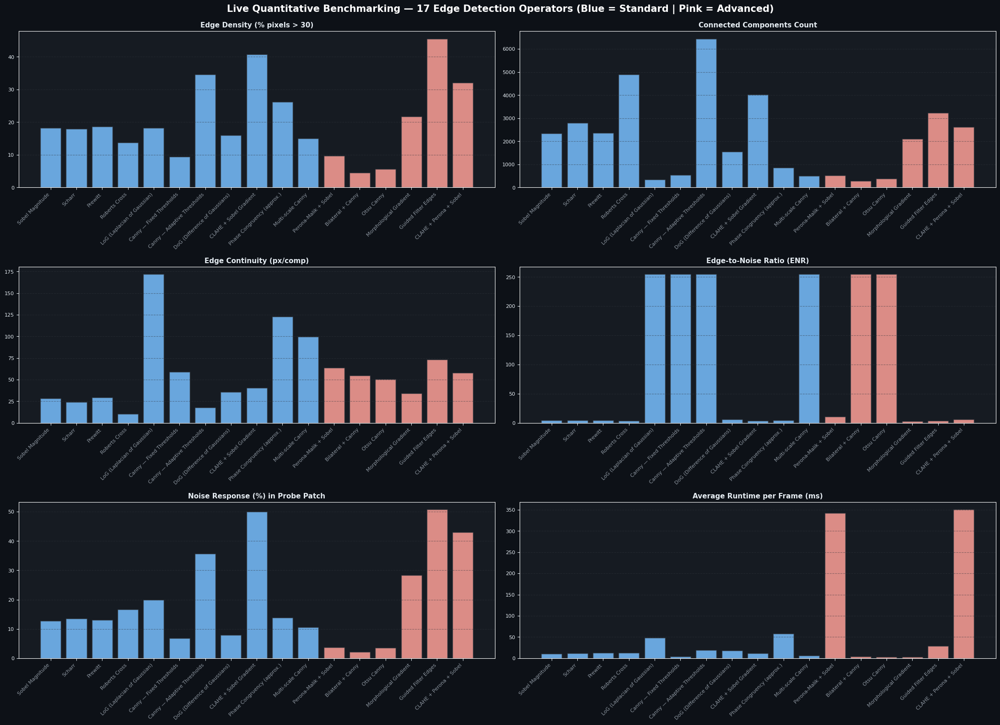


Key Findings from Live Benchmark Run:
  - FASTEST: Otsu Canny (Otsu threshold) with 3.45 ms runtime
  - HIGHEST ENR: LoG (Laplacian of Gaussian) with ENR of 255.00
  - HIGHEST CONTINUITY: LoG (Laplacian of Gaussian) with 172.08 px/comp


In [13]:
# Live Plotting of Dataset-Wide Benchmark Results
methods = df_sample_results["Method"].tolist()
params  = [f"{m} ({p})" for m, p in zip(df_sample_results["Method"], df_sample_results["Parameter"])]
dens    = df_sample_results["Edge Density (%)"].tolist()
comps   = df_sample_results["Components"].tolist()
conts   = df_sample_results["Continuity (px/comp)"].tolist()
enrs    = df_sample_results["Edge-to-Noise Ratio"].tolist()
noises  = df_sample_results["Noise Response (%)"].tolist()
runtimes= df_sample_results["Runtime (ms)"].tolist()

x = np.arange(len(methods))
colors = ["#79c0ff" if i < 11 else "#ffa198" for i in range(len(methods))]

fig, axes = plt.subplots(3, 2, figsize=(22, 16))
fig.patch.set_facecolor("#0d1117")
ax1, ax2, ax3, ax4, ax5, ax6 = axes.flatten()

for ax in axes.flatten():
    ax.set_facecolor("#161b22")
    ax.tick_params(colors="#e6edf3", labelsize=8)
    ax.grid(axis="y", color="#30363d", linestyle="--", alpha=0.5)

# 1. Edge Density (%)
ax1.bar(x, dens, color=colors, alpha=0.85, edgecolor="#30363d")
ax1.set_title("Edge Density (% pixels > 30)", color="#e6edf3", fontweight="bold", fontsize=11)
ax1.set_xticks(x); ax1.set_xticklabels(methods, rotation=45, ha="right", color="#8b949e")

# 2. Components
ax2.bar(x, comps, color=colors, alpha=0.85, edgecolor="#30363d")
ax2.set_title("Connected Components Count", color="#e6edf3", fontweight="bold", fontsize=11)
ax2.set_xticks(x); ax2.set_xticklabels(methods, rotation=45, ha="right", color="#8b949e")

# 3. Continuity (px/comp)
ax3.bar(x, conts, color=colors, alpha=0.85, edgecolor="#30363d")
ax3.set_title("Edge Continuity (px/comp)", color="#e6edf3", fontweight="bold", fontsize=11)
ax3.set_xticks(x); ax3.set_xticklabels(methods, rotation=45, ha="right", color="#8b949e")

# 4. Edge-to-Noise Ratio (ENR)
ax4.bar(x, enrs, color=colors, alpha=0.85, edgecolor="#30363d")
ax4.set_title("Edge-to-Noise Ratio (ENR)", color="#e6edf3", fontweight="bold", fontsize=11)
ax4.set_xticks(x); ax4.set_xticklabels(methods, rotation=45, ha="right", color="#8b949e")

# 5. Noise Response (%)
ax5.bar(x, noises, color=colors, alpha=0.85, edgecolor="#30363d")
ax5.set_title("Noise Response (%) in Probe Patch", color="#e6edf3", fontweight="bold", fontsize=11)
ax5.set_xticks(x); ax5.set_xticklabels(methods, rotation=45, ha="right", color="#8b949e")

# 6. Runtime (ms)
ax6.bar(x, runtimes, color=colors, alpha=0.85, edgecolor="#30363d")
ax6.set_title("Average Runtime per Frame (ms)", color="#e6edf3", fontweight="bold", fontsize=11)
ax6.set_xticks(x); ax6.set_xticklabels(methods, rotation=45, ha="right", color="#8b949e")

fig.suptitle("Live Quantitative Benchmarking — 17 Edge Detection Operators (Blue = Standard | Pink = Advanced)", color="white", fontsize=15, fontweight="bold", y=0.99)
plt.tight_layout(pad=1.2)
plot_path = os.path.join(OUTPUT_DIR, 'random_sample_quantitative_analysis.png')
plt.savefig(plot_path, dpi=120, bbox_inches='tight', facecolor=fig.get_facecolor())
plt.show()

print('\nKey Findings from Live Benchmark Run:')
fastest = df_sample_results.loc[df_sample_results['Runtime (ms)'].idxmin()]
highest_enr = df_sample_results.loc[df_sample_results['Edge-to-Noise Ratio'].idxmax()]
highest_cont = df_sample_results.loc[df_sample_results['Continuity (px/comp)'].idxmax()]
print(f"  - FASTEST: {fastest['Method']} ({fastest['Parameter']}) with {fastest['Runtime (ms)']:.2f} ms runtime")
print(f"  - HIGHEST ENR: {highest_enr['Method']} with ENR of {highest_enr['Edge-to-Noise Ratio']:.2f}")
print(f"  - HIGHEST CONTINUITY: {highest_cont['Method']} with {highest_cont['Continuity (px/comp)']:.2f} px/comp")
